# AlexNet Implementation - Train on ImageNet 2012
- Source Literature: [AlexNet Paper](https://papers.nips.cc/paper/2012/file/c399862d3b9d6b76c8436e924a68c45b-Paper.pdf)
- Data Loader Notebook: `AlexNet_Data_Loader.ipynb`
- Vanialla Model and Fused Model Prototypes: `AlexNet_Prototype_Model.ipynb`

## Dataset Directory Structure & Requirements

Enough HDD/SSD space is required for the following:
- Downloading Raw Dataset - 156.8 GB
- Convert to TFRecord and Store - 155.9 GB
- Total Storage Required - 312.7 GB

An SSD is recommended and a Mechanical HDD should be avoided since it will slow down the data loader significantly. 

### Dataset Download

ImageNet Download Link: [Download ImageNet Dataset](https://image-net.org/download-images)

- Download Train Images (Required): `ILSVRC2012_img_train.tar` - Size 137.7 GB
- Download Val Images (Required): `ILSVRC2012_img_val.tar` - Size 6.3 GB
- Download Train Images (Optional): `ILSVRC2012_img_test.tar` - Size 12.7 GB

### Raw/Source Dataset Directory Structure
Download the dataset from the above link and put it in the folder like shown:
```
imagenet2012/
├── ILSVRC2012_img_test.tar
├── ILSVRC2012_img_train.tar
└── ILSVRC2012_img_val.tar
```

### Processed/Destination Dataset Directory Structure
Create another folder and create the folders `data`, `download` & `extracted` like shown:
```
imagenet/
├── data/
├── downloaded/
└── extracted/
```

In [1]:
import os

os.environ["TF_FORCE_GPU_ALLOW_GROWTH"] = "true"
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "1"

import tensorflow as tf
import tensorflow_addons as tfa
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
import numpy as np
from pprint import pprint

plt.rcParams["figure.figsize"] = 30, 30

/home/mike/miniconda3/lib/python3.9/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/home/mike/miniconda3/lib/python3.9/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/home/mike/miniconda3/lib/python3.9/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl5mutexC1Ev']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/home/mike/miniconda3/lib/python3.9/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/home/mike/miniconda3/lib/python3.9/site-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/home/mike/miniconda3/lib/python3.9/site-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZNK10tensorflow4data11DatasetBase8Fina

# ImageNet Data Loader

In [2]:
# Constants 

image_dims = (227, 227)
num_classes = 1000
NUM_CLASSES = num_classes
BATCH_SIZE = None
NUM_CHANNELS = 3
AUTOTUNE = tf.data.experimental.AUTOTUNE
HEIGHT, WIDTH  = image_dims

In [3]:
# Data Processing 

import tensorflow as tf

def preprocess_image(image, label):
    """
    Process the image and label to perform the following operations:
    - Min-Max scale the image divided by 255
    - Convert the numerical values of the lables to one-hot encoded format
    - Resize the image to (227, 227)
    Args:
        image(image tensor): Raw image
        label(tensor): Numeric labels 1, 2, 3, ...
    Returns:
        tuple: Scaled image, one-hot encoded label
    """
    # Change the tf.unint8 into tf.float32 in the code of AlexNet model.  
    image = tf.cast(image, tf.uint8)
    # image = tf.image.resize(image, [self.HEIGHT, self.WIDTH])
    image = tf.image.resize(image, [HEIGHT, WIDTH])
    image = image / tf.math.reduce_max(image)
    # label = tf.one_hot(indices=label, depth=self.NUM_CLASSES)
    label = tf.one_hot(indices=label, depth=NUM_CLASSES)

    return image, label


# self.NUM_CHANNELS
# tf.function explained: https://zhuanlan.zhihu.com/p/414324501
@tf.function
def augment_batch(image, label):
    """
    Image augmentation for training:
    - Random Contrast
    - Random Brightness
    - Random Hue(Color)
    - Random Saturation
    - random Flip Left Right
    - Random Jpeg Quality
    Args:
        image(Tensor Image): Raw Image
        label(Tensor): Numeric Labels 1, 2, 3, ...
    Returns:
        tuple: Augmented image, numeric labels 1, 2, 3, ...
    """
    if tf.random.normal([1]) < 0:
        image = tf.image.random_contrast(image, 0.2, 0.9)
    if tf.random.normal([1]) < 0:
        image = tf.image.random_brightness(image, 0.2)
    if NUM_CHANNELS == 3 and tf.random.normal([1]) < 0:
        image = tf.image.random_hue(image, 0.3)
    if NUM_CHANNELS == 3 and tf.random.normal([1]) < 0:
        image = tf.image.random_saturation(image, 0, 15)
    
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_jpeg_quality(image, 10, 100)

    return image, label

In [4]:
# ImageNet Data Loader

class ImageNetDataLoader:


    # def __init__(self, source_dir, dest_dir, split="train", image_dims=(227,227), num_classes=1000):
    def __init__(self, source_dir, dest_dir, num_classes=1000, split="train"):
        """
        - Instance variable initialization
        - Download and set up the dataset with one-off operation
        - Use the TensorFlow tfds to Load and convert the ImageNet Dataset
        Args:
            source_dir(str): Path to downloaded tar files
            dest_dir(str): Path to the location where the dataset will be unpacked
            split(str): Split data for example with[80%:20%], defaulted as "train"
            image_dims(tuple, optional): Image dimensions (width & height)
            num_classes(int): Number of classes contained in this dataset
        """

        # Provide the constants regarded as variables instantiated
        # self.NUM_CLASSES = num_classes
        # self.BATCH_SIZE = None
        # self.NUM_CHANNELS = 3
        # -self.LABELS = []
        # -self.LABELMAP = {}
        # tf.data.AUTOTUNE is another option but not verfified
        # self.AUTOTUNE = tf.data.experimental.AUTOTUNE
        # self.HEIGHT, self.WIDTH  = image_dims  
        # How to set image_dims in the script or data_process.py?   
        
        # Download the Config
        download_config = tfds.download.DownloadConfig(
            extract_dir=os.path.join(dest_dir, 'extracted'), 
            manual_dir=source_dir)

        # download_and_prepare()是tfds.core.DatasetBuilder类的方法 
        download_and_prepare_kwargs = {
            'download_dir': os.path.join(dest_dir, 'downloaded'),
            'download_config': download_config}

        # TFDS Data Loader with performing dataset conversion to TFRecord
        self.ds, self.ds_info = tfds.load(
            # 参数name表示数据集的名字, 类型为str, 因此定义为'imagenet2012'
            'imagenet2012', 
            # data目录包括从原始数据集转换获得的json和tfrecord数据(167G)
            data_dir=os.path.join(dest_dir, 'data'),  
            # 要加载数据的那一个分割(的部分)如"train", "test", ["train", "test"]、"train[80%:]"…; 
            # 若split=None，则返回Dict[Split, tf.data.Dataset]中的所有拆分，参见split API
            split=split, 
            # 参数shuffle_files表示是否打乱输入的数据
            shuffle_files=True,  
            # 若为True，则把下载的数据转换为TFRecord格式并保存在data_dir中，若设置为False，则在三个步骤中缺少
            # builder.download_and_prepare()。
            download=True, # If False, data is expected to be in data_dir
            # True表示数据集的每一条数据保存为监督学习的方式–2元组(input,label); False表示数据集的每一条数据
            # 保存为字典类型{feature1:input, feature:label}. 
            as_supervised=True,
            # 若为True，则返回的数据集为一个元组(tf.data.Dataset,tfds.core.DatasetInfo)；若为False，则返回
            # 为一个tf.data.Dataset对象
            with_info=True,
            # 若download=True，则关键字参数kwargs传递给tfds.core.DatasetBuilder.download_and_prepare；
            download_and_prepare_kwargs=download_and_prepare_kwargs)

    def dataset_generator(self, batch_size=32, augment=False):
    # def dataset_generator(self, batch_size=32, augment_args=False):
        """
        Create the data loader pipeline and return a generator to generate datsets
        Args:
            batch_size(int, optional): Batch size defaulted to 32.
            augment(bool, optional): Enable/Disable augmentation defaulted to False.
        Returns:
            Tf.Data Generator: Dataset generator
        """
        # self.BATCH_SIZE = batch_size
        BATCH_SIZE = batch_size

        # dataset = self.dataset.apply(tf.data.experimental.ignore_errors())
        dataset = self.ds.apply(tf.data.experimental.ignore_errors())
        dataset = dataset.shuffle(batch_size * 10)
        dataset = dataset.repeat()
          
        # if augment:
        if augment:
            dataset = dataset.map(augment_batch, num_parallel_calls=AUTOTUNE)
        
        dataset = dataset.map(preprocess_image, num_parallel_calls=AUTOTUNE)
        dataset = dataset.batch(batch_size)
        dataset = dataset.prefetch(buffer_size=AUTOTUNE)

        return dataset


    def get_dataset_size(self):
        """
        get_dataset_size
        Get the dataset size(number of images)
        Returns:
            int: Total number of images in the dataset
        """

        # return len(self.dataset)
        return len(self.ds)
    

    def get_num_steps(self):
        """
        Get the number of steps required per batch for training
        Raises:
            AssertionError: Dataset generator needs to be initialized first
        Returns:
            int: Number of steps required for training per batch
        """
        # if self.BATCH_SIZE is None:
        if BATCH_SIZE is None:

            raise AssertionError(
                # f"Batch Size is not Initialized. Call this method only after calling: {dataset_generator}"
                f"Batch Size is not Initialized. Call this method only after calling: {self.dataset_generator}"
            )   
        num_steps = self.get_dataset_size() // BATCH_SIZE + 1

        return num_steps
    

    def visualize_batch(self, augment=True):
        """
        Dataset sample visualization
        - Support augmentation
        - Automatically adjust for grayscale images
        Args:
            augment(bool, optional): Enable/Disable augmentation defaulted to True.
        """
        # if self.NUM_CHANNELS == 1:
        if NUM_CHANNELS == 1:
            cmap = "gray"
        else:
            cmap = "viridis"

        dataset = self.dataset_generator(batch_size=36, augment=augment)
        image_batch, label_batch = next(iter(dataset))
        image_batch, label_batch = (image_batch.numpy(), label_batch.numpy(),)

        for n in range(len(image_batch)):
            ax = plt.subplot(6, 6, n + 1)
            plt.imshow(image_batch[n], cmap=cmap)
            plt.title(np.argmax(label_batch[n]))
            plt.axis("off")

        plt.show() 

In [5]:
data_loader = ImageNetDataLoader(
        source_dir = "/media/drive1/ImageNet2012",
        dest_dir = "/media/drive1/imdata/imagenet",
        split = "train",
        # image_dims = (227, 227),
)

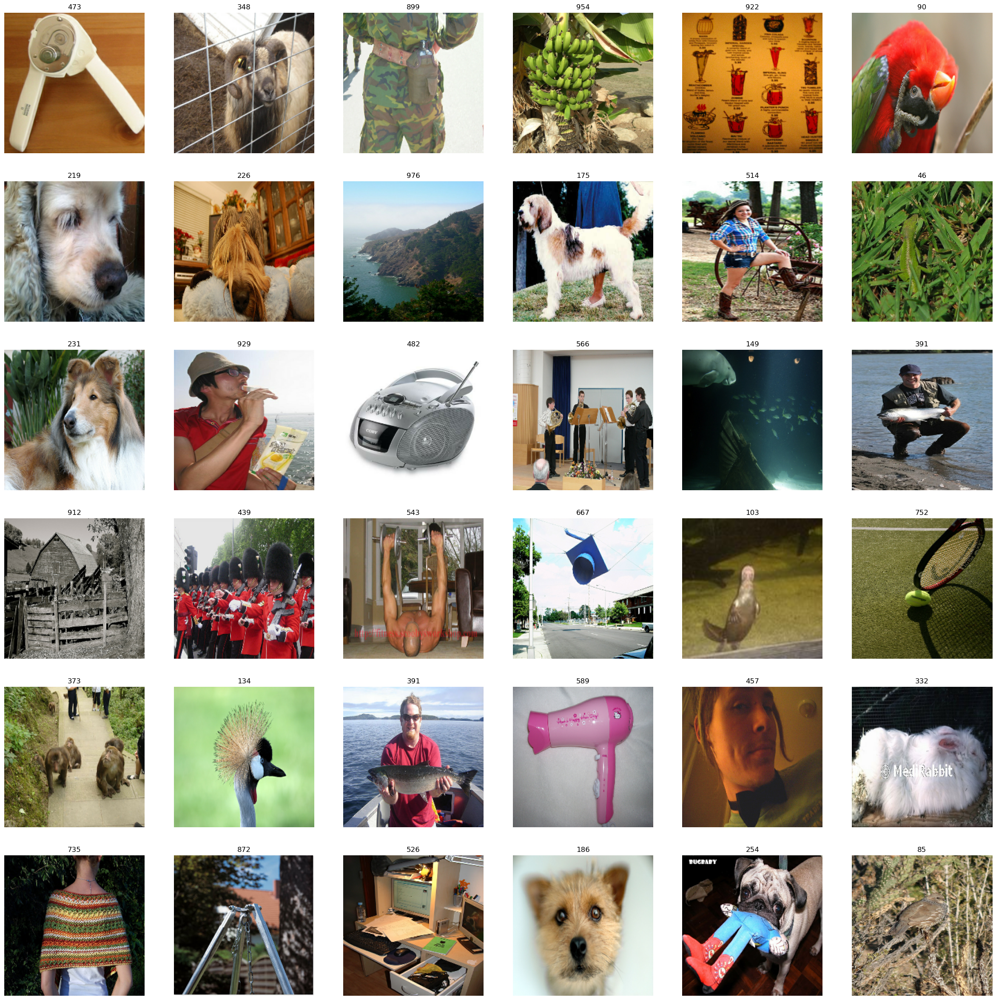

In [6]:
data_loader.visualize_batch(augment=False)

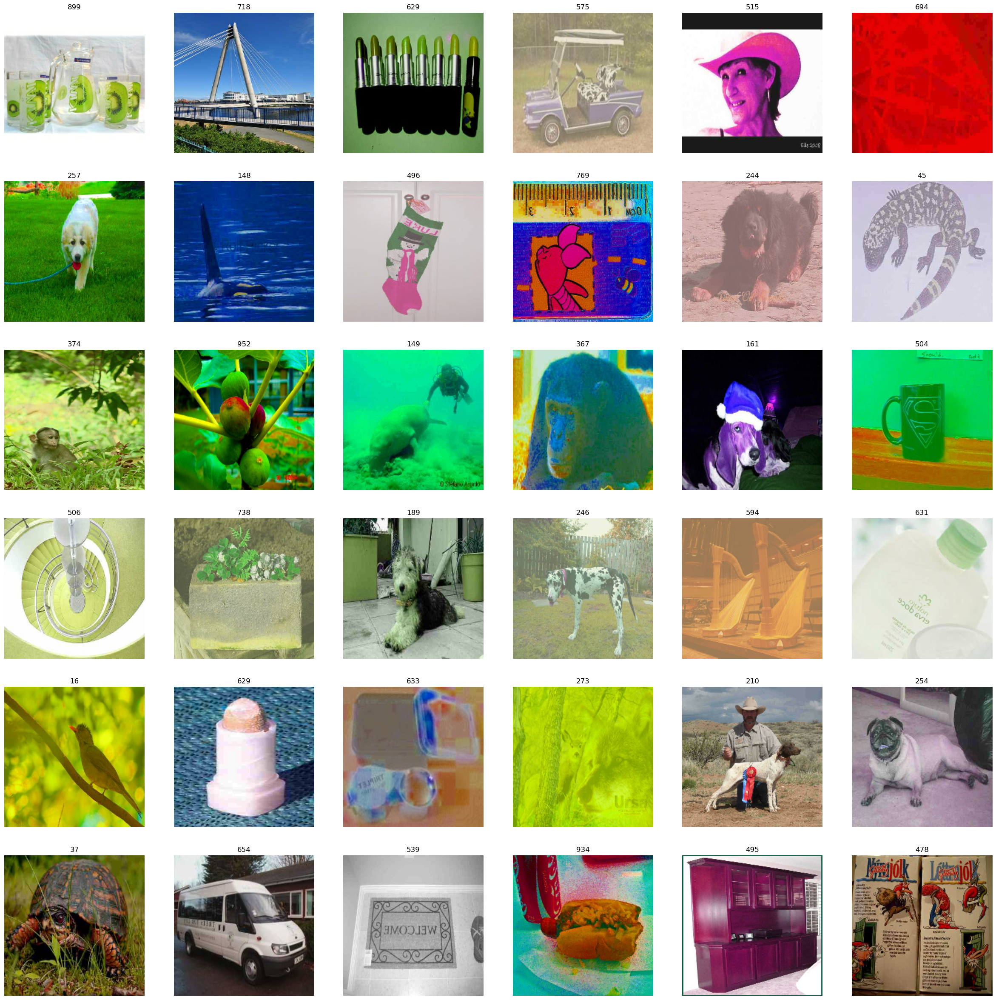

In [7]:
data_loader.visualize_batch(augment=True)

# Fused AlexNet Architecture

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 alexnet_input (InputLayer)  [(None, 227, 227, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 57, 57, 96)        34944     
                                                                 
 batch_normalization (BatchN  (None, 57, 57, 96)       384       
 ormalization)                                                   
                                                                 
 re_lu (ReLU)                (None, 57, 57, 96)        0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 28, 28, 96)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 28, 28, 256)       614656

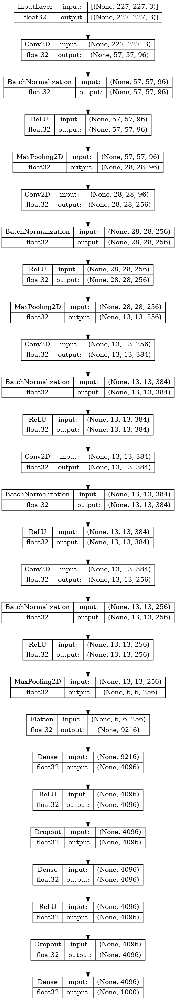

In [8]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras import Input
from tensorflow.keras.layers import Conv2D, BatchNormalization, ReLU, MaxPooling2D, Dense, Flatten, Dropout
from tensorflow.keras.utils import plot_model

# ValueError: Please provide to Input either a `shape` or a `tensor` argument. Note that `shape` does not 
# include the batch dimension.
# inputs = Input(input_shape=(227,227,3), name="alexnet_input")
inputs = Input(shape=(227,227,3), name="alexnet_input")

# Layer 1    
x = Conv2D(96, (11,11), strides=4, padding="same")(inputs)
x = BatchNormalization()(x)
x = ReLU()(x)
x = MaxPooling2D((3,3), strides=2)(x)

# Layer 2
x = Conv2D(256, (5,5), strides=1, padding='same')(x)
x = BatchNormalization()(x)
x = ReLU()(x)
x = MaxPooling2D((3,3), strides=2)(x)

# Layer 3
x = Conv2D(384, (3,3), strides=1, padding='same')(x)
x = BatchNormalization()(x)
x = ReLU()(x)

# Layer 4
x = Conv2D(384, (3,3), strides=1, padding='same')(x)
x = BatchNormalization()(x)
x = ReLU()(x)

# Layer 5
x = Conv2D(256, (3,3), strides=1, padding='same')(x)
x = BatchNormalization()(x)
x = ReLU()(x)
x = MaxPooling2D((3,3), strides=2)(x)

# Layer 6
x = Flatten()(x)
x = Dense(4096)(x)
x = ReLU()(x)
x = Dropout(rate=0.5)(x)

# Layer 7
x = Dense(4096)(x)
x = ReLU()(x)
x = Dropout(rate=0.5)(x)

# Layer 8
outputs = Dense(1000, activation='softmax', dtype=tf.float32, name="alexnet_output")(x)

alexnet = Model(inputs=inputs, outputs=outputs)

alexnet.summary()

tf.keras.utils.plot_model(alexnet, show_layer_names=False, show_shapes=True, show_dtype=True)

# Training Callbacks
- Early Stopping - Stop Training if Validation Accuracy Stops Increasing
- Model Checkpoint - Save Model Weights (Model) if Validation Accuracy improves
- Reduce Learning Rate - As per the Author Specifications, Learning Rate is Reduced by a factor of 10 if loss validation accuracy does not improve
- Tensorboard - Log the Training and Validation Metrics on Tensorboard for Training Analysis

In [9]:
# Callbacks
early_stop_cb = tf.keras.callbacks.EarlyStopping(
    monitor="val_categorical_accuracy",
    min_delta=0,
    patience=10,
    verbose=1,
    mode="auto",
    baseline=None,
    restore_best_weights=True,
)
model_ckpt_cb = tf.keras.callbacks.ModelCheckpoint(
    "weights/alexnet.{epoch:02d}-{val_categorical_accuracy:.2f}-{val_loss:.2f}.h5",
    monitor="val_categorical_accuracy",
    verbose=0,
    save_best_only=True,
    save_weights_only=False,
    mode="auto",
    save_freq="epoch",
)
reduce_lr_cb = tf.keras.callbacks.ReduceLROnPlateau(
    monitor="val_categorical_accuracy",
    factor=0.1,
    patience=2,
    verbose=0,
    mode="auto",
    min_delta=0.0001,
    cooldown=0,
    min_lr=10e-8,
)
tensorboard_cb = tf.keras.callbacks.TensorBoard(
    log_dir="tb_logs/",
    histogram_freq=2,
    write_graph=True,
    write_images=False,
    update_freq="epoch",
    profile_batch=2,
    embeddings_freq=2,
    embeddings_metadata=None,
)
callbacks = [early_stop_cb, model_ckpt_cb, reduce_lr_cb, tensorboard_cb]

# Training and Validation Metrics

### Legend:
- **TP** - True Positive
- **FP** - False Positive
- **TN** - True Negative
- **FN** - False Negative

### Metrices:
- **Categorical Accuracy** = $\frac{TP+FP}{TP+FP+TN+FN}$
- **Precision** = $\frac{TP}{TP+FP}$
- **Recall** = $\frac{TP}{TP+FN}$
- **F1 Score** = $2*\frac{Precision*Recall}{Precision+Recall}$

In [10]:
# Metrics
metrics = [
    tf.keras.metrics.CategoricalAccuracy(),
    tf.keras.metrics.FalseNegatives(),
    tf.keras.metrics.FalsePositives(),
    tf.keras.metrics.Precision(),
    tf.keras.metrics.Recall(),
    tfa.metrics.F1Score(num_classes=1000)
]

# Mixed Precision Training
Enable Mixed Precision Training for Supported GPUs to utilize the optimized Tensor Cores for Matrix Operations. 

Read About Tensor Cores Here: [Tensor Cores - Nvidia Developer](https://www.nvidia.com/en-in/data-center/tensor-cores/)

In [11]:
# Mixed Precision
tf.keras.mixed_precision.set_global_policy("mixed_float16")

The dtype policy mixed_float16 may run slowly because this machine does not have a GPU. Only Nvidia GPUs with compute capability of at least 7.0 run quickly with mixed_float16.
If you will use compatible GPU(s) not attached to this host, e.g. by running a multi-worker model, you can ignore this warning. This message will only be logged once


The dtype policy mixed_float16 may run slowly because this machine does not have a GPU. Only Nvidia GPUs with compute capability of at least 7.0 run quickly with mixed_float16.
If you will use compatible GPU(s) not attached to this host, e.g. by running a multi-worker model, you can ignore this warning. This message will only be logged once


# Initialize Data Loader for Training & Validation

In [12]:
# Constants
BATCH_SIZE = 512


# Init Data Loaders
train_data_loader = ImageNetDataLoader(
        source_dir = "/media/drive1/ImageNet2012",
        dest_dir = "/media/drive1/imdata/imagenet",
        split = "train",
        # image_dims = (227, 227),
)

val_data_loader = ImageNetDataLoader(
        source_dir = "/media/drive1/ImageNet2012",
        dest_dir = "/media/drive1/imdata/imagenet",
        split = "validation",
        # image_dims = (227, 227),
)

train_generator = train_data_loader.dataset_generator(batch_size=BATCH_SIZE, augment=False)
val_generator = val_data_loader.dataset_generator(batch_size=BATCH_SIZE, augment=False)

train_steps = train_data_loader.get_num_steps()
val_steps = val_data_loader.get_num_steps()

# Compile Model and Start Training

In [ ]:
# Constants
# EPOCHS = 200
EPOCHS = 1

# Compile & Train
alexnet.compile(
    loss=tf.keras.losses.CategoricalCrossentropy(),
    optimizer=tf.keras.optimizers.SGD(
        learning_rate=0.01, momentum=0.9, nesterov=False, name='SGD'
    ),
    metrics=metrics,
)

history = alexnet.fit(
    epochs=EPOCHS,
    x=train_generator,
    steps_per_epoch=train_steps,
    validation_data=val_generator,
    validation_steps=val_steps,
    callbacks=callbacks
)

 658/2503 [======>.......................] - ETA: 8:52:44 - loss: 6.7023 - categorical_accuracy: 0.0059 - false_negatives: 336884.0000 - false_positives: 55.0000 - precision: 0.1791 - recall: 3.5619e-05 - f1_score: 0.0035